In [1]:
!pip install -q datasets[audio] librosa

In [2]:
import numpy as np
from IPython.display import Audio as IPythonAudio
from datasets import load_dataset
import librosa
import librosa.display
import matplotlib.pyplot as plt

In [ ]:
gtzan = load_dataset("marsyas/gtzan", "all")

In [4]:
gtzan

DatasetDict({
    train: Dataset({
        features: ['file', 'audio', 'genre'],
        num_rows: 999
    })
})

In [5]:
gtzan["train"].features

{'file': Value(dtype='string', id=None),
 'audio': Audio(sampling_rate=22050, mono=True, decode=True, id=None),
 'genre': ClassLabel(names=['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock'], id=None)}

In [6]:
example = gtzan["train"][0]
example

{'file': '/root/.cache/huggingface/datasets/downloads/extracted/3b204381d6c029312e4f9c569c6b1130af3041dd36ca38ca53d4e20f585e39c6/genres/blues/blues.00000.wav',
 'audio': {'path': '/root/.cache/huggingface/datasets/downloads/extracted/3b204381d6c029312e4f9c569c6b1130af3041dd36ca38ca53d4e20f585e39c6/genres/blues/blues.00000.wav',
  'array': array([ 0.00732422,  0.01660156,  0.00762939, ..., -0.05560303,
         -0.06106567, -0.06417847]),
  'sampling_rate': 22050},
 'genre': 0}

In [7]:
# getting the label names explicitly
id2label_fn = gtzan["train"].features["genre"].int2str
id2label_fn(example["genre"])

'blues'

In [8]:
array = example["audio"]["array"]
sampling_rate = example["audio"]["sampling_rate"]

record = IPythonAudio(array, rate=sampling_rate)
display(record)

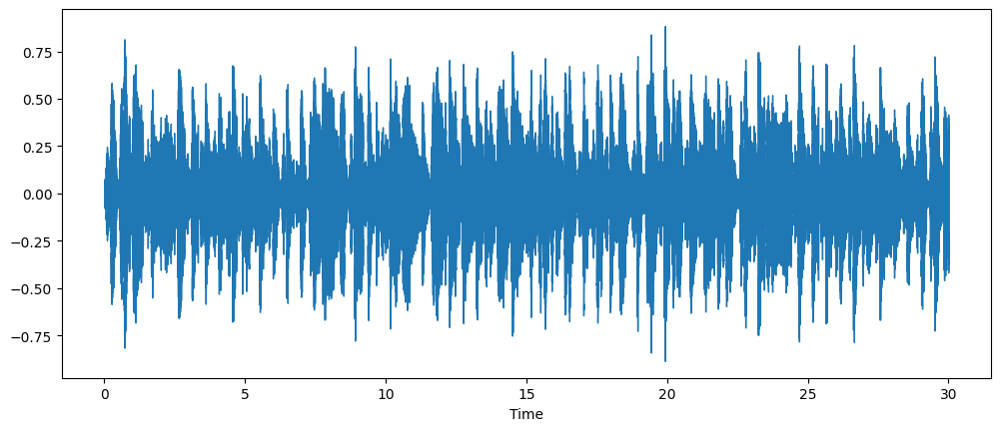

In [9]:
plt.figure().set_figwidth(12)
librosa.display.waveshow(array, sr=sampling_rate)

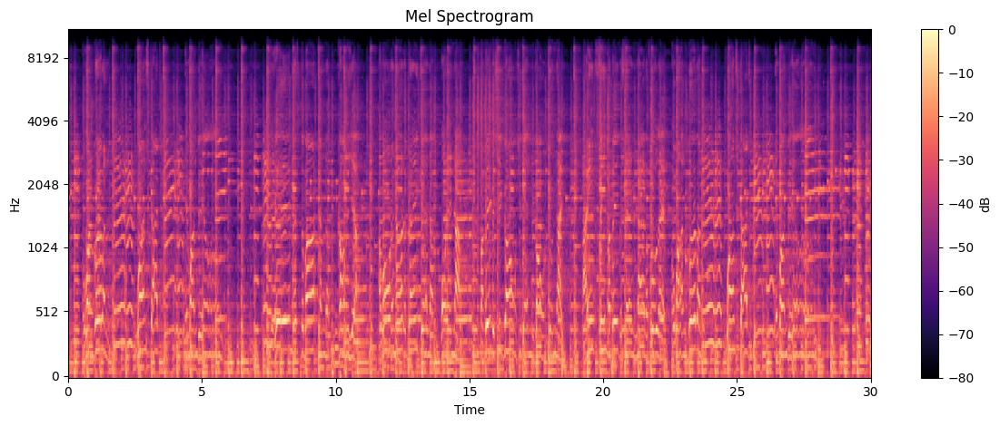

In [10]:
s = librosa.feature.melspectrogram(y=array, sr=sampling_rate, n_mels=128, fmax=sampling_rate / 2)
s_db = librosa.power_to_db(s, ref=np.max)

plt.figure().set_figwidth(12)
librosa.display.specshow(s_db, x_axis="time", y_axis="mel", sr=sampling_rate, fmax=sampling_rate / 2)
plt.colorbar(label="dB")
plt.title("Mel Spectrogram")
plt.tight_layout()
plt.show()

In [11]:
def f(array, sampling_rate, window_sizes, hop_lengths, mel_bands):

  num_plots = len(window_sizes) * len(hop_lengths) * len(mel_bands)

  fig, axes = plt.subplots(
      int(np.ceil(num_plots / 3)), 3, figsize=(15, 5 * int(np.ceil(num_plots / 3)))
  )
  axes = axes.flatten()

  plot_index = 0
  for window_size in window_sizes:
      for hop_length in hop_lengths:
          for mel_band in mel_bands:

              s = librosa.feature.melspectrogram(
                  y=array, sr=sampling_rate, n_fft=window_size, hop_length=hop_length, n_mels=mel_band
              )

              s_db = librosa.power_to_db(s, ref=np.max)

              ax = axes[plot_index]
              librosa.display.specshow(s_db, x_axis='time', y_axis='mel', sr=sampling_rate, ax=ax)
              ax.set_title(
                  f'Window: {window_size}, Hop: {hop_length}, Mel Bands: {mel_band}'
              )
              plot_index += 1

  for ax in axes[plot_index:]:
      ax.remove()

  plt.tight_layout()
  plt.show()


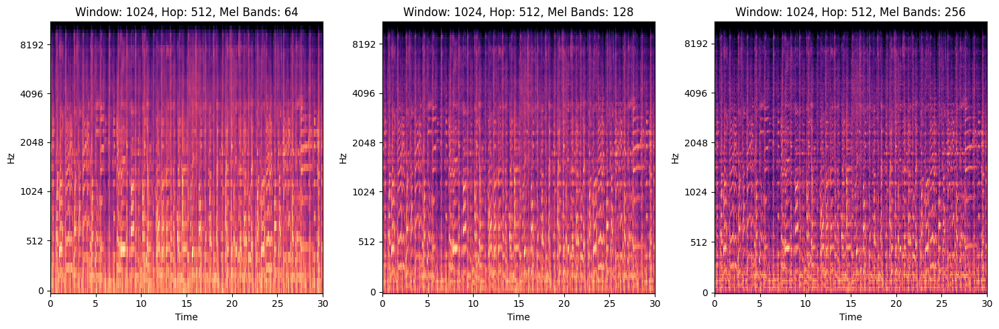

In [12]:
window_sizes = [1024]
hop_lengths = [512]
mel_bands = [64, 128, 256]

f(array, sampling_rate, window_sizes, hop_lengths, mel_bands)


A higher number of Mel bands provides finer frequency resolution.
A lower number of Mel bands reduces computational complexity and can generalize better in some applications.

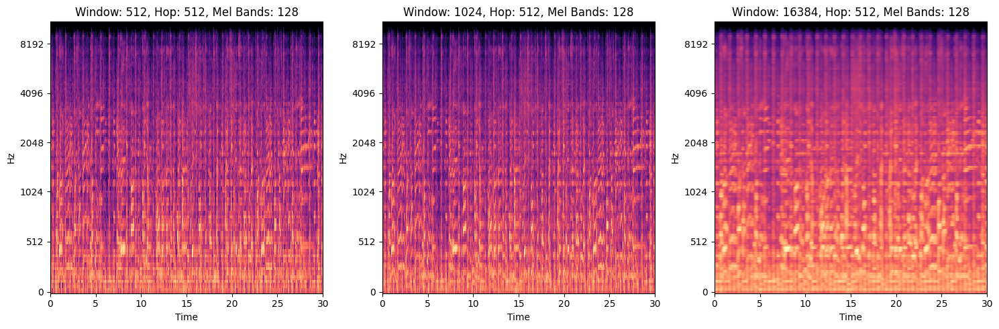

In [13]:
window_sizes = [512, 1024, 1024*16]
hop_lengths = [512]
mel_bands = [128]

f(array, sampling_rate, window_sizes, hop_lengths, mel_bands)

Smaller window sizes give better time resolution but poorer frequency resolution.
Larger window sizes give better frequency resolution but poorer time resolution.

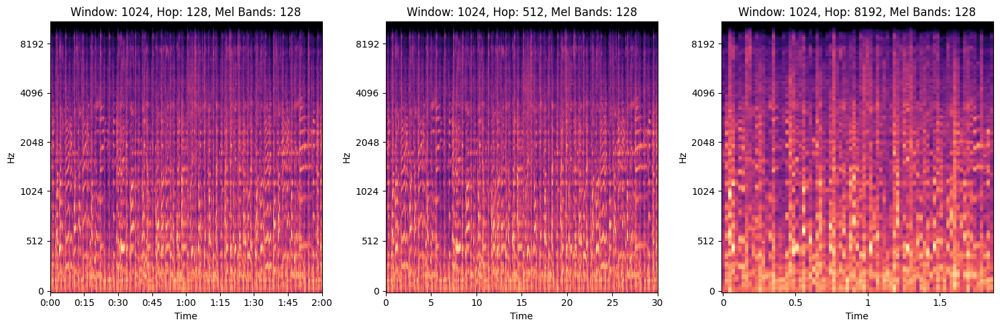

In [14]:
window_sizes = [1024]
hop_lengths = [128, 512, 1024*8]
mel_bands = [128]

f(array, sampling_rate, window_sizes, hop_lengths, mel_bands)

Smaller hop lengths create a more detailed spectrogram but increase computation time and redundancy.
Larger hop lengths are faster to compute but can miss fine temporal details.

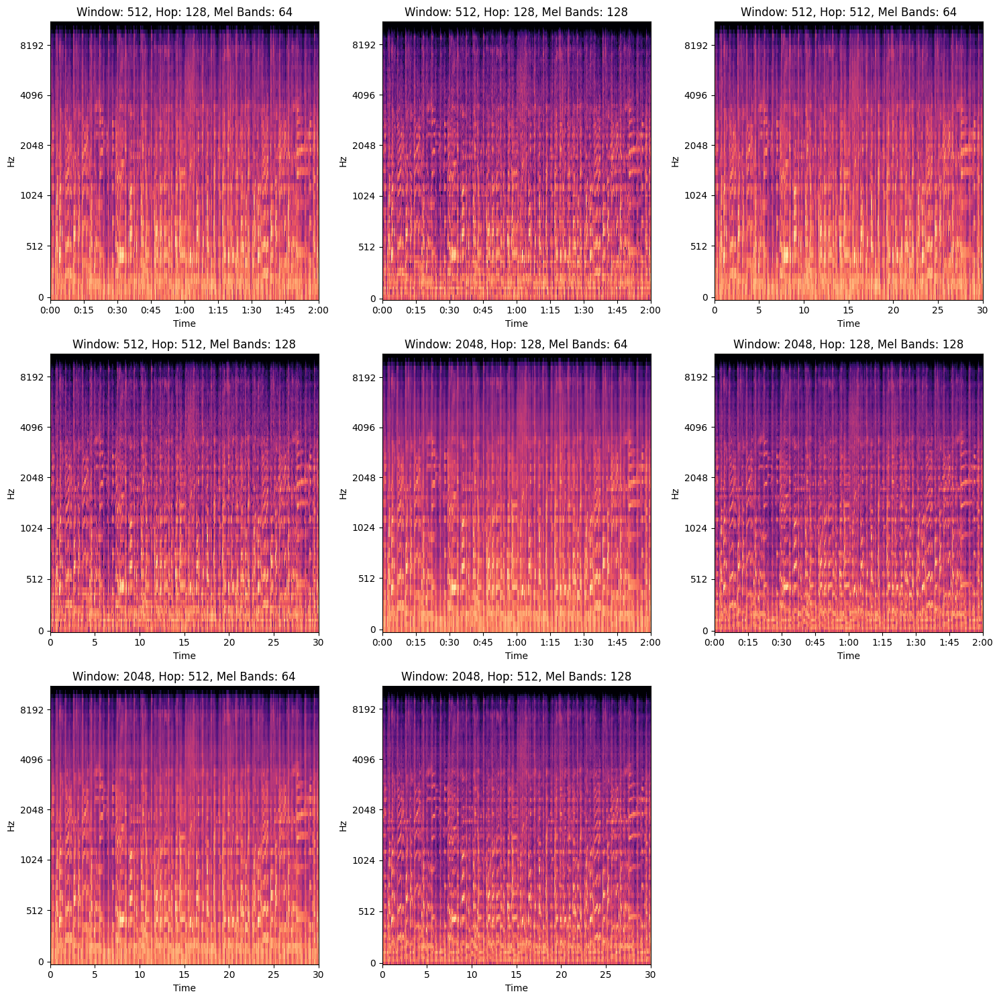

In [15]:
window_sizes = [512, 2048]
hop_lengths = [128, 512]
mel_bands = [64, 128]

f(array, sampling_rate, window_sizes, hop_lengths, mel_bands)

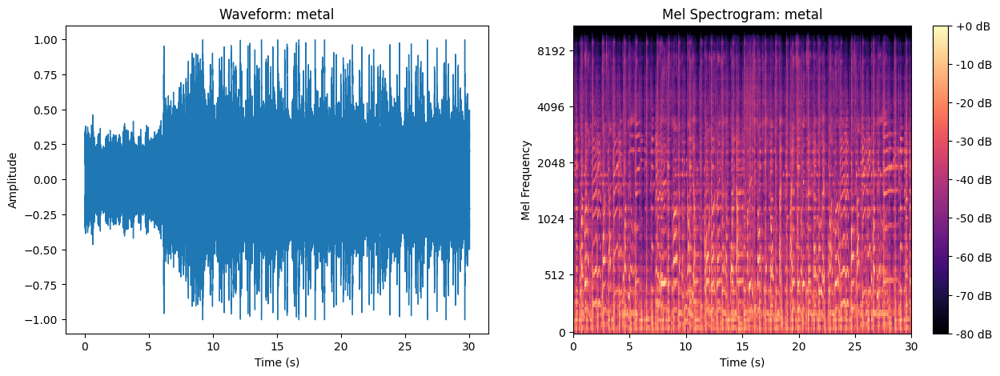

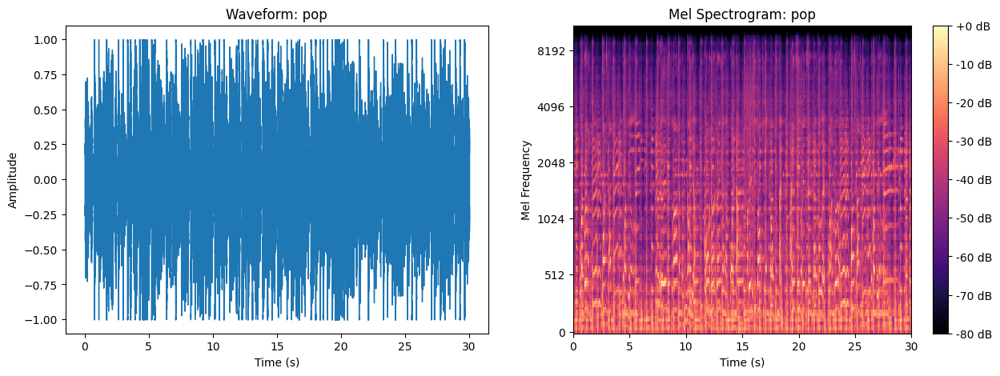

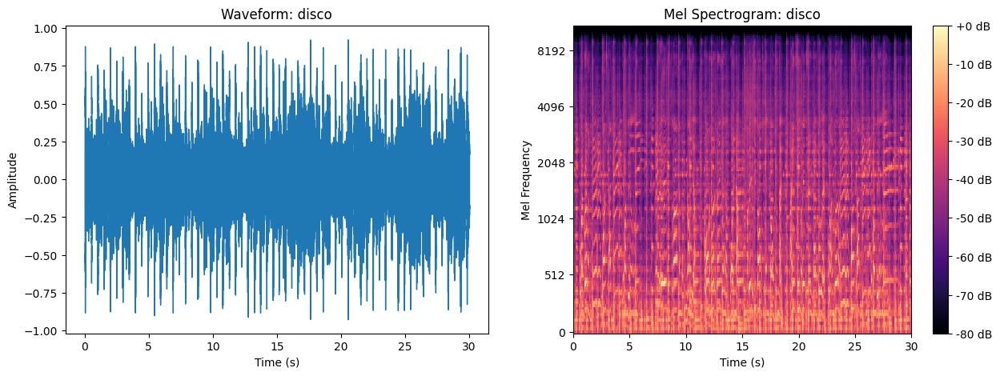

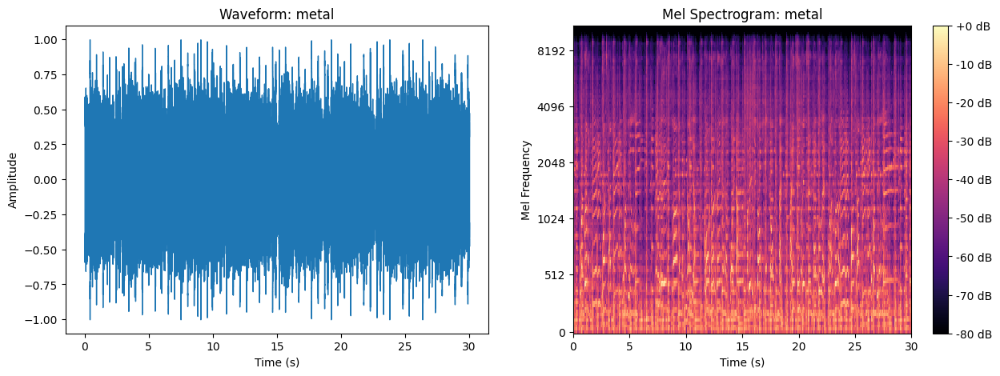

In [16]:
random_numbers = [int(i) for i in np.random.randint(0, 1000, size=4)]

for i, x in enumerate(random_numbers):
    array= gtzan["train"][x]["audio"]["array"]
    sampling_rate = gtzan["train"][x]["audio"]["sampling_rate"]
    label = id2label_fn(gtzan["train"][x]["genre"])

    display(IPythonAudio(array, rate=sampling_rate))

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    fig.subplots_adjust(hspace=0.5)

    ax_waveform = axes[0]
    ax_spectrogram = axes[1]
    title = label

    librosa.display.waveshow(array, sr=sampling_rate, ax=ax_waveform)
    ax_waveform.set_title(f"Waveform: {title}")
    ax_waveform.set_xlabel("Time (s)")
    ax_waveform.set_ylabel("Amplitude")

    s = librosa.feature.melspectrogram(y=array, sr=sampling_rate, n_mels=128, fmax=sampling_rate / 2)
    s_dB = librosa.power_to_db(s, ref=np.max)

    img = librosa.display.specshow(s_db, x_axis="time", y_axis="mel", sr=sampling_rate, fmax=sampling_rate / 2, ax=ax_spectrogram)
    ax_spectrogram.set_title(f"Mel Spectrogram: {title}")
    ax_spectrogram.set_xlabel("Time (s)")
    ax_spectrogram.set_ylabel("Mel Frequency")
    plt.colorbar(img, ax=ax_spectrogram, format="%+2.0f dB")

    plt.show()
